## Summary of Results

This notebook implements and evaluates five tasks related to adversarial robustness using ResNet-34 and DenseNet-121. The table below summarizes the top-1 and top-5 accuracy numbers.

### ResNet-34 Evaluation (Tasks 1–4)
- **Baseline Accuracy**: Top-1 = 75.39%, Top-5 = 93.87%
- **FGSM Attack**: Top-1 = 3.00% (Drop 96.02%), Top-5 = 19.00% (Drop 79.76%)
- **PGD Attack**: Top-1 = 0.00% (Drop 100.00%), Top-5 = 0.80% (Drop 99.15%)
- **Patch Attack**: Top-1 = 9.80%, Top-5 = 38.20%

### DenseNet-121 Transferability (Task 5)
- **Original Test Set**: Top-1 = 70.80%, Top-5 = 91.20%
- **Adversarial Test Set 1 (FGSM)**: Top-1 = 40.00%, Top-5 = 69.60%
- **Adversarial Test Set 2 (PGD)**: Top-1 = 32.20%, Top-5 = 68.20%
- **Adversarial Test Set 3 (Patch)**: Top-1 = 61.60%, Top-5 = 85.60%

For details on implementation, visualizations, and evaluation logic, please refer to the code and results sections below.

# Task 1

In [4]:
import os
import json
import torch
import numpy as np
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Loading Pre-trained model

In [5]:
# pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
model = model.to(device)
model.eval()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 179MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Define the transforms

In [6]:
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms  = np.array([0.229, 0.224, 0.225])
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])
dataset = datasets.ImageFolder(root="./TestDataSet", transform=plain_transforms)
print(dataset.classes[:20])   # Print only the first 20 to have a look
print("Total", len(dataset.classes), "classes")

['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426', 'n02730930', 'n02747177', 'n02749479', 'n02769748', 'n02776631', 'n02777292', 'n02782093', 'n02783161', 'n02786058', 'n02787622']
Total 100 classes


### Loading dataset

In [10]:
dataset_path = "./TestDataSet"
dataset = datasets.ImageFolder(root=dataset_path, transform=plain_transforms)

### Read the labels.json and establish the mapping

In [11]:
# Obtain 100 SynSets
synsets = dataset.classes

# Obtain 100 class names
with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
    label_list = json.load(f)

# Extract the class name section
json_classnames = [x.split(": ")[1] for x in label_list]

print("The first 5 synsets in the folder:", synsets[:5])
print("The first 5 classes names of labels_list.json:", json_classnames[:5])

# Print out the forms that need to compare manually
for i, (syn, name) in enumerate(zip(synsets, json_classnames)):
    print(f"{i:3}:  {syn:<12}  <--→  {name}")


The first 5 synsets in the folder: ['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877']
The first 5 classes names of labels_list.json: ['accordion', 'acoustic guitar', 'aircraft carrier', 'airliner', 'airship']
  0:  n02672831     <--→  accordion
  1:  n02676566     <--→  acoustic guitar
  2:  n02687172     <--→  aircraft carrier
  3:  n02690373     <--→  airliner
  4:  n02692877     <--→  airship
  5:  n02699494     <--→  altar
  6:  n02701002     <--→  ambulance
  7:  n02704792     <--→  amphibian
  8:  n02708093     <--→  analog clock
  9:  n02727426     <--→  apiary
 10:  n02730930     <--→  apron
 11:  n02747177     <--→  ashcan
 12:  n02749479     <--→  assault rifle
 13:  n02769748     <--→  backpack
 14:  n02776631     <--→  bakery
 15:  n02777292     <--→  balance beam
 16:  n02782093     <--→  balloon
 17:  n02783161     <--→  ballpoint
 18:  n02786058     <--→  Band Aid
 19:  n02787622     <--→  banjo
 20:  n02788148     <--→  bannister
 21:  n02790996     <--→ 

In [12]:
# read labels_list.json
json_path = os.path.join(dataset_path, "labels_list.json")
with open(json_path, "r") as f:
    label_list = json.load(f)

# Construct the name to index mapping
name_to_idx = {}
for item in label_list:
    parts = item.split(": ")
    idx = int(parts[0])
    name = parts[1].strip()
    name_to_idx[name] = idx

# Build the synset to index mapping
syn_to_name = {
    'n02672831': 'accordion',
    'n02676566': 'acoustic guitar',
    'n02687172': 'aircraft carrier',
    'n02690373': 'airliner',
    'n02692877': 'airship',
    'n02699494': 'altar',
    'n02701002': 'ambulance',
    'n02704792': 'amphibian',
    'n02708093': 'analog clock',
    'n02727426': 'apiary',
    'n02730930': 'apron',
    'n02747177': 'ashcan',
    'n02749479': 'assault rifle',
    'n02769748': 'backpack',
    'n02776631': 'bakery',
    'n02777292': 'balance beam',
    'n02782093': 'balloon',
    'n02783161': 'ballpoint',
    'n02786058': 'Band Aid',
    'n02787622': 'banjo',
    'n02788148': 'bannister',
    'n02790996': 'barbell',
    'n02791124': 'barber chair',
    'n02791270': 'barbershop',
    'n02793495': 'barn',
    'n02794156': 'barometer',
    'n02795169': 'barrel',
    'n02797295': 'barrow',
    'n02799071': 'baseball',
    'n02802426': 'basketball',
    'n02804414': 'bassinet',
    'n02804610': 'bassoon',
    'n02807133': 'bathing cap',
    'n02808304': 'bath towel',
    'n02808440': 'bathtub',
    'n02814533': 'beach wagon',
    'n02814860': 'beacon',
    'n02815834': 'beaker',
    'n02817516': 'bearskin',
    'n02823428': 'beer bottle',
    'n02823750': 'beer glass',
    'n02825657': 'bell cote',
    'n02834397': 'bib',
    'n02835271': 'bicycle-built-for-two',
    'n02837789': 'bikini',
    'n02840245': 'binder',
    'n02841315': 'binoculars',
    'n02843684': 'birdhouse',
    'n02859443': 'boathouse',
    'n02860847': 'bobsled',
    'n02865351': 'bolo tie',
    'n02869837': 'bonnet',
    'n02870880': 'bookcase',
    'n02871525': 'bookshop',
    'n02877765': 'bottlecap',
    'n02879718': 'bow',
    'n02883205': 'bow tie',
    'n02892201': 'brass',
    'n02892767': 'brassiere',
    'n02894605': 'breakwater',
    'n02895154': 'breastplate',
    'n02906734': 'broom',
    'n02909870': 'bucket',
    'n02910353': 'buckle',
    'n02916936': 'bulletproof vest',
    'n02917067': 'bullet train',
    'n02927161': 'butcher shop',
    'n02930766': 'cab',
    'n02939185': 'caldron',
    'n02948072': 'candle',
    'n02950826': 'cannon',
    'n02951358': 'canoe',
    'n02951585': 'can opener',
    'n02963159': 'cardigan',
    'n02965783': 'car mirror',
    'n02966193': 'carousel',
    'n02966687': "carpenter's kit",
    'n02971356': 'carton',
    'n02974003': 'car wheel',
    'n02977058': 'cash machine',
    'n02978881': 'cassette',
    'n02979186': 'cassette player',
    'n02980441': 'castle',
    'n02981792': 'catamaran',
    'n02988304': 'CD player',
    'n02992211': 'cello',
    'n02992529': 'cellular telephone',
    'n02999410': 'chain',
    'n03000134': 'chainlink fence',
    'n03000247': 'chain mail',
    'n03000684': 'chain saw',
    'n03014705': 'chest',
    'n03016953': 'chiffonier',
    'n03017168': 'chime',
    'n03018349': 'china cabinet',
    'n03026506': 'Christmas stocking',
    'n03028079': 'church',
    'n03032252': 'cinema',
    'n03041632': 'cleaver',
    'n03042490': 'cliff dwelling'
}

# Construct synset to global index
label_map = {syn: name_to_idx[name] for syn, name in syn_to_name.items()}

# Construct numeric_labels
numeric_labels = [label_map[syn] for syn in dataset.classes]
print("numeric_labels has been constructed, the first five：", numeric_labels[:5])


numeric_labels has been constructed, the first five： [401, 402, 403, 404, 405]


In [13]:
def compute_topk_accuracy(outputs, targets, topk=(1,5)):
    maxk = max(topk)
    batch_size = targets.size(0)

    _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)  # [B, maxk]
    pred = pred.t()  # [maxk, B]
    correct = pred.eq(targets.view(1, -1).expand_as(pred))

    res = {}
    for k in topk:
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
        res[k] = correct_k.item() * 100.0 / batch_size
    return res


In [14]:
from torch.utils.data import DataLoader
import torch

# Evaluate the set loader
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=0)

# Prepare to evaluate
total1, total5, batches = 0.0, 0.0, 0
model.eval()

with torch.no_grad():
    for imgs, folder_idxs in loader:
        imgs = imgs.to(device)
        outputs = model(imgs)  # [B, 1000]

        # Construct the real labels using numeric_labels
        true_idxs = [numeric_labels[i] for i in folder_idxs.tolist()]
        targets = torch.tensor(true_idxs, dtype=torch.long, device=device)

        acc = compute_topk_accuracy(outputs, targets, topk=(1, 5))
        total1 += acc[1]
        total5 += acc[5]
        batches += 1

# Print
print(f"Baseline Top-1 Accuracy: {total1/batches:.2f}%")
print(f"Baseline Top-5 Accuracy: {total5/batches:.2f}%")


Baseline Top-1 Accuracy: 75.39%
Baseline Top-5 Accuracy: 93.87%


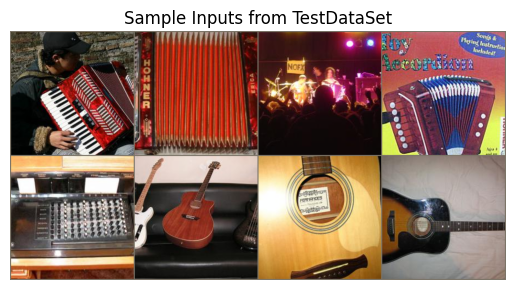

In [16]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

images, labels = next(iter(loader))
grid = make_grid(images[:8], nrow=4).permute(1, 2, 0)
plt.imshow(grid.numpy() * std_norms + mean_norms)  # unnormalize
plt.title("Sample Inputs from TestDataSet")
plt.axis("off")
plt.show()

In [15]:
# Store the Baseline results
baseline_top1 = total1 / batches
baseline_top5 = total5 / batches

# Save the result to a file
with open("baseline_accuracy.txt", "w") as f:
    f.write(f"{baseline_top1:.2f}\n{baseline_top5:.2f}")


# Task 2

In [17]:
import os
import torch
import torch.nn.functional as F
import torchvision
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from tqdm import tqdm
from PIL import Image

# 1.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.02
dataset_pa = "./TestDataSet"
adv_dir   = "./Adversarial_Test_Set_1"
os.makedirs(adv_dir, exist_ok=True)

# 2. load from Task1's numeric_labels

# 3. Pre-treatment & Standardization
# When generating adversarial samples: read-only graph + ToTensor
prep = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
# When evaluating adversarial samples: ToTensor + Normalize
normalized_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
# The mean/std tensor is used for internal standardization in fgsm
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)

# 4. Loading model
model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
model = model.to(device).eval()

# Load the category label
imagenet_classes = {
    idx: name for idx, name in enumerate(models.ResNet34_Weights.IMAGENET1K_V1.meta["categories"])
}

# 5. FGSM attack function
def fgsm_attack(model, image, label_idx, ε, mean, std):
    """
    image: [1,3,224,224] tensor ∈ [0,1]
    label_idx: Python int in [0..999]
    """
    x = image.clone().detach().to(device)
    x.requires_grad_()
    # After standardization, it is sent into the model
    normed = (x - mean) / std
    out = model(normed)
    target = torch.tensor([label_idx], device=device)
    loss = F.cross_entropy(out, target)
    loss.backward()
    # Single-step sign update
    pert = ε * x.grad.data.sign()
    adv = torch.clamp(x + pert, 0.0, 1.0)
    return adv.detach()



# 6. Generate adversarial samples & verify L∞ & visualization
# Reuse raw_dataset to read the original image
raw_ds = datasets.ImageFolder(dataset_pa, transform=prep)
loader = DataLoader(raw_ds, batch_size=1, shuffle=False)

max_linf = 0.0
mis_examples = []
for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    # from folder_idx (0..99) Map to the all ImageNet idx (0..999)
    true_idx = numeric_labels[folder_idx.item()]

    # Generate adversarial
    adv = fgsm_attack(model, img, true_idx, epsilon, mean, std)
    # 2. Calculate and track L∞
    linf = (adv - img).abs().max().item()
    max_linf = max(max_linf, linf)
    assert linf <= epsilon + 1e-6, f"L∞={linf:.5f} > ε"


    # Save the confrontation map
    save_path = os.path.join(adv_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)

    # Collect the first 5 examples of "originally correct → later misjudged"
    if len(mis_examples) < 5:
        with torch.no_grad():
            pred_o = model((img - mean) / std).argmax(1).item()
            pred_a = model((adv - mean) / std).argmax(1).item()
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples.append((img.cpu(), adv.cpu(), true_idx))

# After the loop ends, print the maximum L∞
print(f"Maximum L∞ distance over all adversarial samples: {max_linf:.5f}")

# 7. Evaluate the FGSM countermeasure set Top-1 / Top-5
class AdvDataset(Dataset):
    def __init__(self, image_dir, labels, transform):
        self.paths = sorted(os.listdir(image_dir))
        self.dir   = image_dir
        self.labels= labels
        self.trans = transform
    def __len__(self): return len(self.labels)
    def __getitem__(self, i):
        path = os.path.join(self.dir, self.paths[i])
        img  = Image.open(path).convert("RGB")     # PIL Image
        img_t = self.trans(img)                    # ToTensor()+Normalize()
        return img_t, self.labels[i]

# generate expanded_labels：pictures, five of each category
expanded_labels = []
for i in range(100):
    expanded_labels += [numeric_labels[i]] * 5

adv_ds  = AdvDataset(adv_dir, expanded_labels, normalized_transform)
adv_lo  = DataLoader(adv_ds, batch_size=32, shuffle=False)

total1 = total5 = 0
total   = 0
with torch.no_grad():
    for imgs, lbls in adv_lo:
        imgs = imgs.to(device)
        lbls = torch.tensor(lbls, device=device)
        out  = model(imgs)
        _, pred5 = out.topk(5, dim=1)
        total += lbls.size(0)
        total1 += (pred5[:,0] == lbls).sum().item()
        for p,true in zip(pred5, lbls):
            if true.item() in p.tolist():
                total5 += 1

# Read the baseline accuracy rate
with open("baseline_accuracy.txt", "r") as f:
    lines = f.readlines()
    baseline_top1 = float(lines[0].strip())
    baseline_top5 = float(lines[1].strip())

# Current FGSM accuracy rate
fgsm_top1 = 100 * total1 / total
fgsm_top5 = 100 * total5 / total

# drop rate
drop1 = (baseline_top1 - fgsm_top1) / baseline_top1 * 100
drop5 = (baseline_top5 - fgsm_top5) / baseline_top5 * 100


print(f"FGSM Top-1 Accuracy: {fgsm_top1:.2f}%  (Drop {drop1:.2f}%)")
print(f"FGSM Top-5 Accuracy: {fgsm_top5:.2f}%  (Drop {drop5:.2f}%)")


100%|██████████| 500/500 [00:20<00:00, 24.75it/s]
<ipython-input-17-c5163d288cbf>:132: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lbls = torch.tensor(lbls, device=device)


Maximum L∞ distance over all adversarial samples: 0.02000
FGSM Top-1 Accuracy: 3.00%  (Drop 96.02%)
FGSM Top-5 Accuracy: 19.00%  (Drop 79.76%)


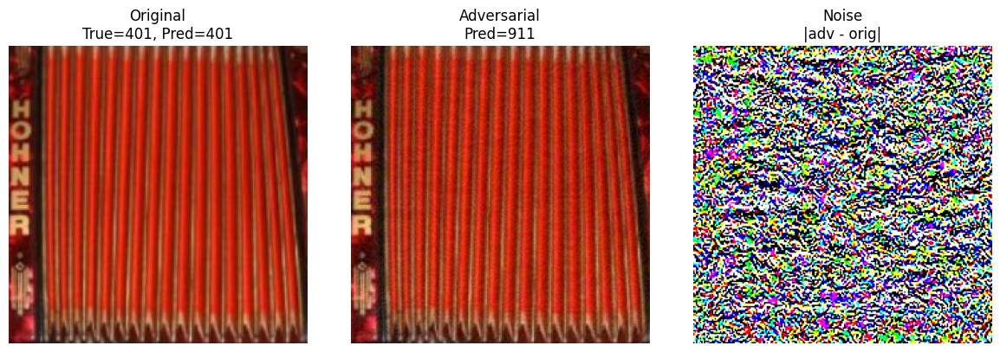

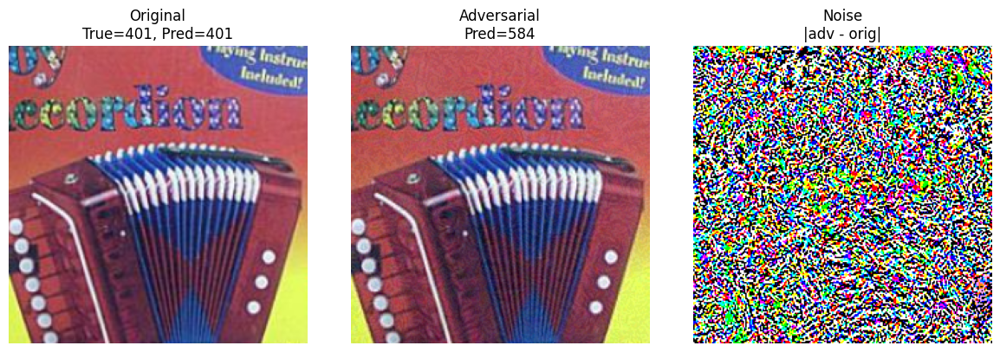

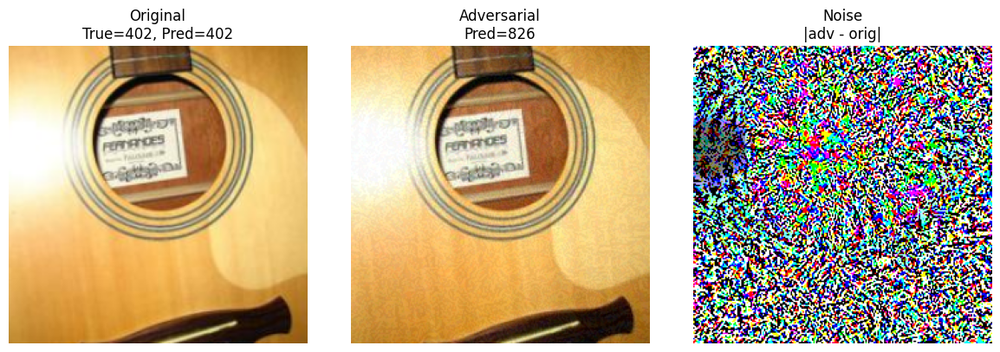

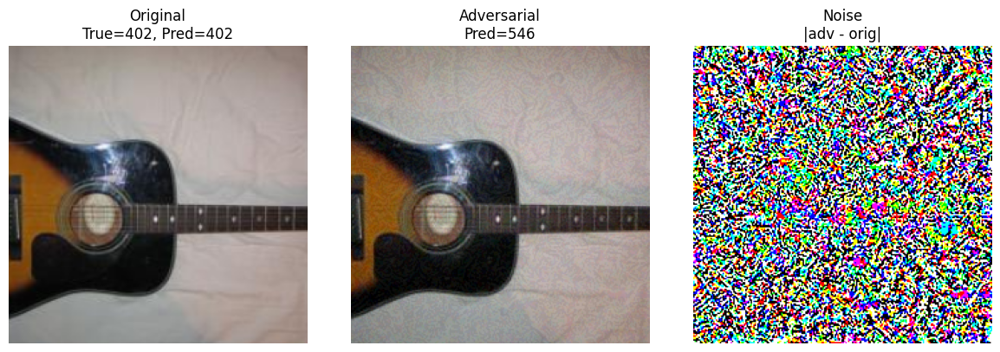

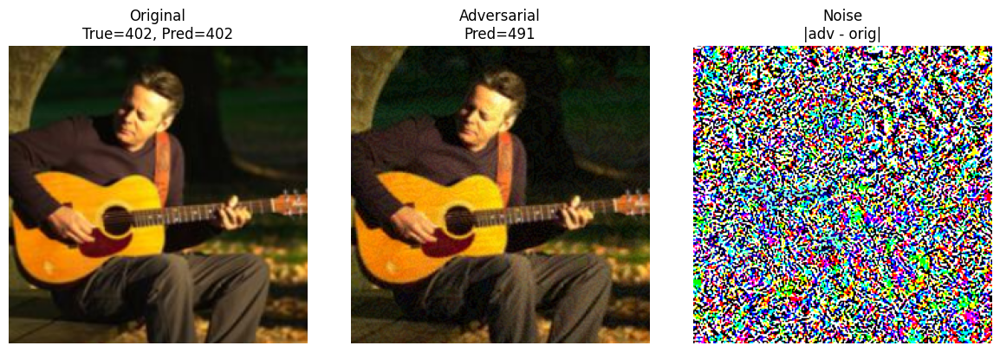

In [19]:
def visualize_attack(img_orig, img_adv, label, model, mean, std):
    model.eval()

    #Standardized images are used for model prediction
    img_o_input = (img_orig.to(device) - mean) / std
    img_a_input = (img_adv.to(device) - mean) / std

    with torch.no_grad():
        pred_o = model(img_o_input).argmax(1).item()
        pred_a = model(img_a_input).argmax(1).item()

    # Calculate the disturbance difference graph
    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min()) # Normalized perturbation is convenient for display

    # Display three pictures and mark the label information
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title(f"Original\nTrue={label}, Pred={pred_o}")
    axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title(f"Adversarial\nPred={pred_a}")
    axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise\n|adv - orig|")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()

# Image pairs for visualizing the effect of FGSM attacks (original image/countermeasure image/Noise)
for img_o, img_a, lbl in mis_examples:
    visualize_attack(img_o, img_a, lbl, model, mean, std)


# Task 3

In [24]:
# ─── Task 3: PGD Attack  ─────────────────────────────────────────────

import torch.nn as nn

# PGD attack function
def pgd_attack(model, image, label_idx, epsilon, alpha, iters, mean, std):
    x = image.clone().detach().to(device)
    x_orig = x.clone().detach()
    x.requires_grad = True

    for _ in range(iters):
        normed = (x - mean) / std
        output = model(normed)
        loss = F.cross_entropy(output, torch.tensor([label_idx], device=device))
        loss.backward()
        grad = x.grad.data
        x = x + alpha * grad.sign()
        x = torch.max(torch.min(x, x_orig + epsilon), x_orig - epsilon)  # Project perturbation back to ε-ball
        x = torch.clamp(x, 0, 1).detach()
        x.requires_grad = True

    return x.detach()

# Create directory for PGD adversarial examples
pgd_dir = "./Adversarial_Test_Set_2"
os.makedirs(pgd_dir, exist_ok=True)

# Generate PGD adversarial examples
epsilon = 0.02
alpha = 0.005
iters = 10

raw_ds.transform = prep  #  Reuse preprocessing from Task 2
loader = DataLoader(raw_ds, batch_size=1, shuffle=False)

mis_examples_pgd = []
max_linf_pgd = 0.0

for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    true_idx = numeric_labels[folder_idx.item()]

    adv = pgd_attack(model, img, true_idx, epsilon, alpha, iters, mean, std)

    linf = (adv - img).abs().max().item()
    max_linf_pgd = max(max_linf_pgd, linf)
    assert linf <= epsilon + 1e-6, f"PGD L∞={linf:.5f} > ε"

    save_path = os.path.join(pgd_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)

    # After the loop, print the maximum L∞ perturbation
    if len(mis_examples_pgd) < 5:
        with torch.no_grad():
            pred_o = model((img - mean) / std).argmax(1).item()
            pred_a = model((adv - mean) / std).argmax(1).item()
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples_pgd.append((img.cpu(), adv.cpu(), true_idx))

print(f"[PGD] Maximum L∞ distance: {max_linf_pgd:.5f}")

# Evaluate PGD adversarial dataset
adv_ds_pgd = AdvDataset(pgd_dir, expanded_labels, normalized_transform)
adv_lo_pgd = DataLoader(adv_ds_pgd, batch_size=32, shuffle=False)

correct1 = correct5 = total = 0
with torch.no_grad():
    for imgs, lbls in adv_lo_pgd:
        imgs = imgs.to(device)
        lbls = torch.tensor(lbls, device=device)
        out = model(imgs)
        _, pred5 = out.topk(5, dim=1)
        correct1 += (pred5[:, 0] == lbls).sum().item()
        for p, true in zip(pred5, lbls):
            if true.item() in p.tolist():
                correct5 += 1
        total += lbls.size(0)
# Load baseline Top-1 and Top-5 accuracy
with open("baseline_accuracy.txt", "r") as f:
    baseline_top1, baseline_top5 = map(float, f.readlines())

pgd_top1 = 100 * correct1 / total
pgd_top5 = 100 * correct5 / total

# drop rate
drop1 = (baseline_top1 - pgd_top1) / baseline_top1 * 100
drop5 = (baseline_top5 - pgd_top5) / baseline_top5 * 100

print(f"PGD Top-1 Accuracy: {pgd_top1:.2f}%  (Drop {drop1:.2f}%)")
print(f"PGD Top-5 Accuracy: {pgd_top5:.2f}%  (Drop {drop5:.2f}%)")



100%|██████████| 500/500 [01:15<00:00,  6.59it/s]
<ipython-input-24-06446ded39c4>:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lbls = torch.tensor(lbls, device=device)


[PGD] Maximum L∞ distance: 0.02000
PGD Top-1 Accuracy: 0.00%  (Drop 100.00%)
PGD Top-5 Accuracy: 0.80%  (Drop 99.15%)


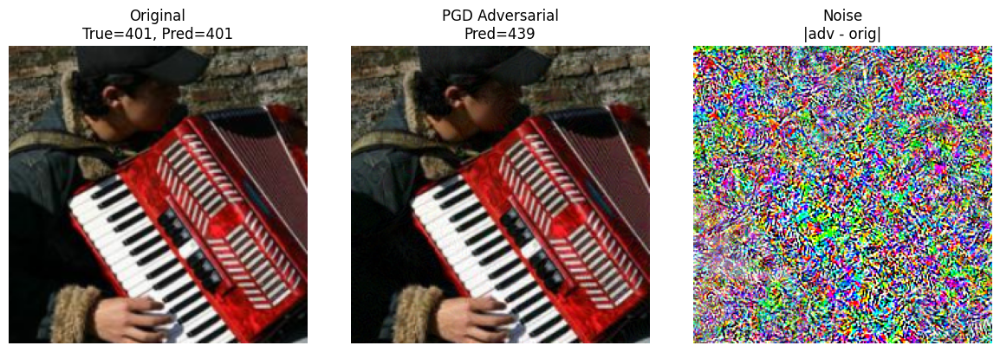

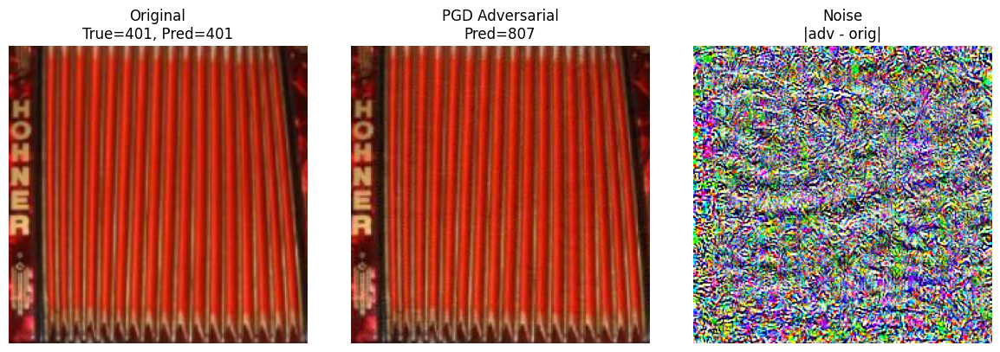

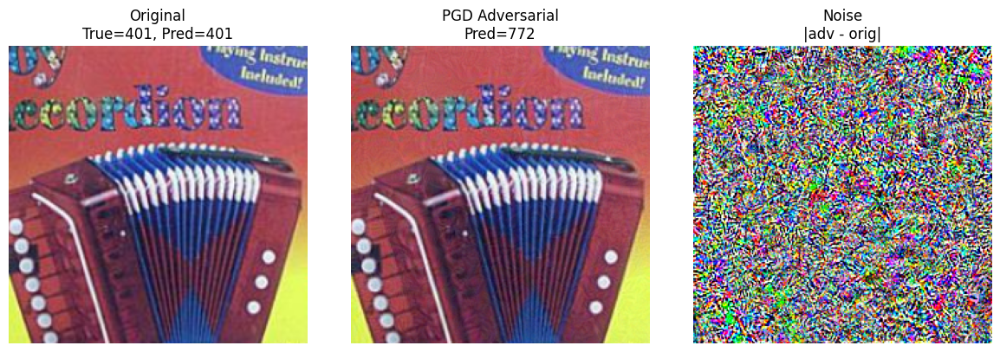

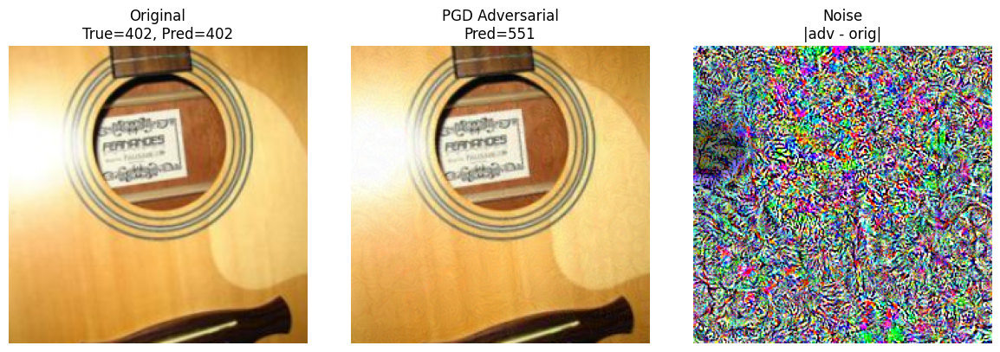

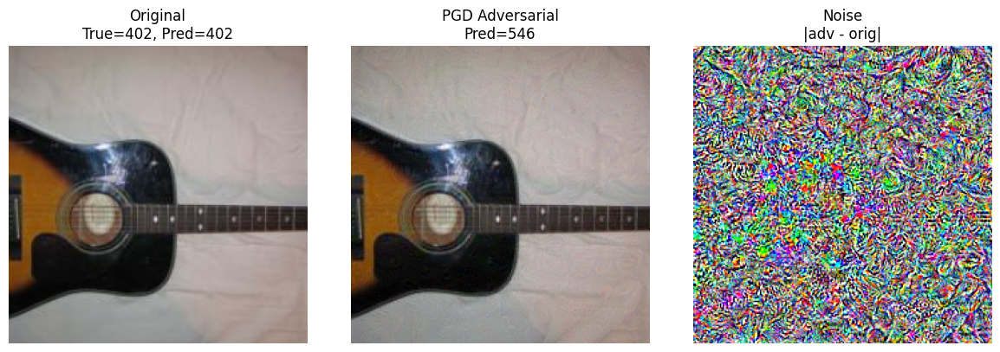

In [25]:
def visualize_attack(img_orig, img_adv, label, model, mean, std):
    model.eval()

    # Standardize before inference
    img_o_input = (img_orig.to(device) - mean) / std
    img_a_input = (img_adv.to(device) - mean) / std

    with torch.no_grad():
        pred_o = model(img_o_input).argmax(1).item()
        pred_a = model(img_a_input).argmax(1).item()

    # Visualize normalized noise
    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min() + 1e-8)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title(f"Original\nTrue={label}, Pred={pred_o}")
    axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title(f"PGD Adversarial\nPred={pred_a}")
    axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise\n|adv - orig|")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()

for img_o, img_a, lbl in mis_examples_pgd:
    visualize_attack(img_o, img_a, lbl, model, mean, std)


# Task 4

In [21]:
import os, torch
import torch.nn.functional as F
from torchvision import transforms, datasets, models
from torchvision.utils import save_image
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
import random

# setting
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
epsilon = 0.4
alpha = 0.025
iters = 30
patch_size = 32
dataset_pa = "./TestDataSet"
patch_dir = "./Adversarial_Test_Set_3"
os.makedirs(patch_dir, exist_ok=True)

# Preprocessing
prep = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])
normalized_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std= [0.229, 0.224, 0.225])
])
mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)

# Model and numeric_labels (reused from Task 1)

# PGD Patch Attack Function
def pgd_patch_attack(model, image, label_idx, epsilon, alpha, iters, mean, std, patch_size):
    x = image.clone().detach().to(device)
    x_orig = x.clone().detach()
    _, _, H, W = x.shape
    # Choose the patch location (fixed center position)
    #top = random.randint(0, H - patch_size)
    #left = random.randint(0, W - patch_size)
    top = (H - patch_size) // 2
    left = (W - patch_size) // 2
    mask = torch.zeros_like(x)
    mask[:, :, top:top+patch_size, left:left+patch_size] = 1.0

    x.requires_grad = True
    for _ in range(iters):
        normed = (x - mean) / std
        output = model(normed)
        loss = F.cross_entropy(output, torch.tensor([label_idx], device=device))
        loss.backward()
        grad = x.grad.data
        x = x + alpha * grad.sign() * mask
        x = torch.max(torch.min(x, x_orig + epsilon * mask), x_orig - epsilon * mask)
        x = torch.clamp(x, 0, 1).detach()
        x.requires_grad = True
    return x.detach()

# Load images
raw_ds = datasets.ImageFolder(dataset_pa, transform=prep)
loader = DataLoader(raw_ds, batch_size=1, shuffle=False)

mis_examples_patch = []
max_linf_patch = 0.0

for idx, (img, folder_idx) in enumerate(tqdm(loader)):
    img = img.to(device)
    true_idx = numeric_labels[folder_idx.item()]
    adv = pgd_patch_attack(model, img, true_idx, epsilon, alpha, iters, mean, std, patch_size)
    linf = (adv - img).abs().max().item()
    max_linf_patch = max(max_linf_patch, linf)
    save_path = os.path.join(patch_dir, f"{idx:04d}.png")
    save_image(adv.cpu(), save_path)
    if len(mis_examples_patch) < 5:
        with torch.no_grad():
            pred_o = model((img - mean) / std).argmax(1).item()
            pred_a = model((adv - mean) / std).argmax(1).item()
        if pred_o == true_idx and pred_a != true_idx:
            mis_examples_patch.append((img.cpu(), adv.cpu(), true_idx))

print(f"[Patch] Max L∞: {max_linf_patch:.5f}")

# Evaluation
class AdvDataset(Dataset):
    def __init__(self, image_dir, labels, transform):
        self.paths = sorted(os.listdir(image_dir))
        self.dir = image_dir
        self.labels = labels
        self.trans = transform
    def __len__(self): return len(self.labels)
    def __getitem__(self, i):
        path = os.path.join(self.dir, self.paths[i])
        img = Image.open(path).convert("RGB")
        img_t = self.trans(img)
        return img_t, self.labels[i]
# Construct labels for 500 adversarial images (5 images per class)
expanded_labels = []
for i in range(100): expanded_labels += [numeric_labels[i]] * 5
adv_ds_patch = AdvDataset(patch_dir, expanded_labels, normalized_transform)
adv_lo_patch = DataLoader(adv_ds_patch, batch_size=32, shuffle=False)

correct1 = correct5 = total = 0
with torch.no_grad():
    for imgs, lbls in adv_lo_patch:
        imgs = imgs.to(device)
        lbls = torch.tensor(lbls, device=device)
        out = model(imgs)
        _, pred5 = out.topk(5, dim=1)
        correct1 += (pred5[:, 0] == lbls).sum().item()
        for p, true in zip(pred5, lbls):
            if true.item() in p.tolist():
                correct5 += 1
        total += lbls.size(0)

print(f"[Patch] Top-1 Accuracy: {100*correct1/total:.2f}%")
print(f"[Patch] Top-5 Accuracy: {100*correct5/total:.2f}%")


100%|██████████| 500/500 [03:29<00:00,  2.39it/s]
<ipython-input-21-9e7129368439>:111: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lbls = torch.tensor(lbls, device=device)


[Patch] Max L∞: 0.40000
[Patch] Top-1 Accuracy: 9.80%
[Patch] Top-5 Accuracy: 38.20%


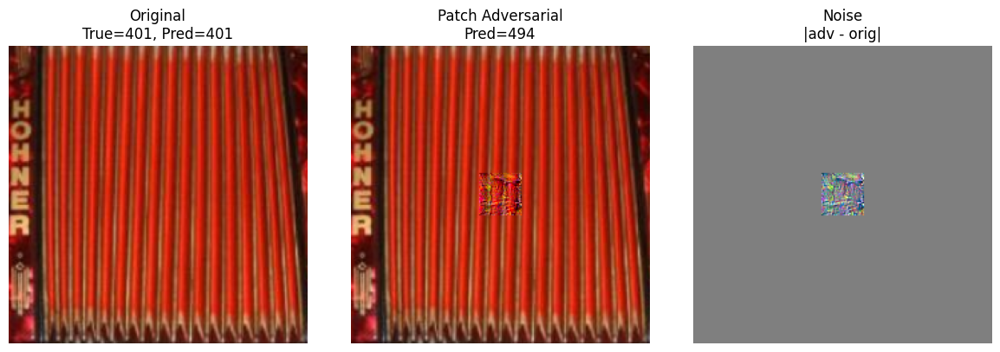

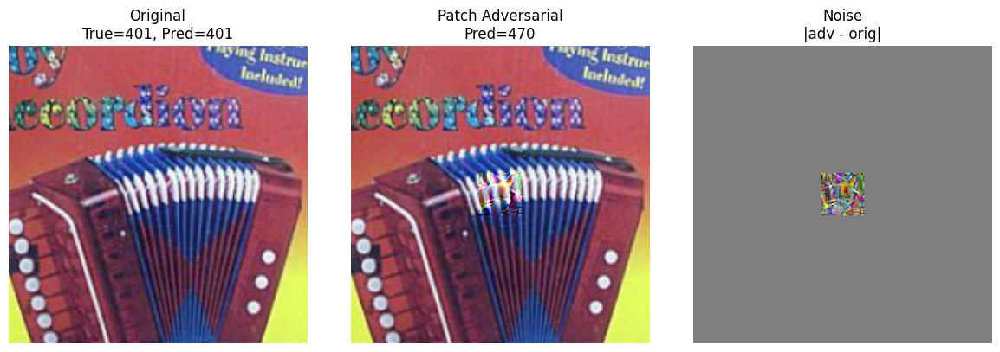

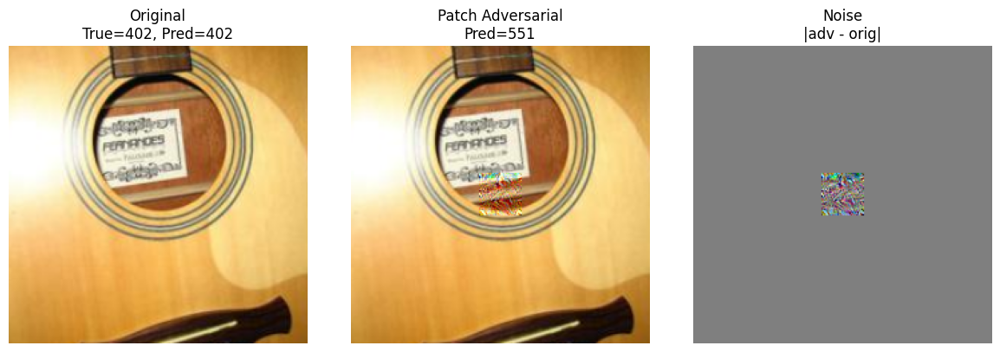

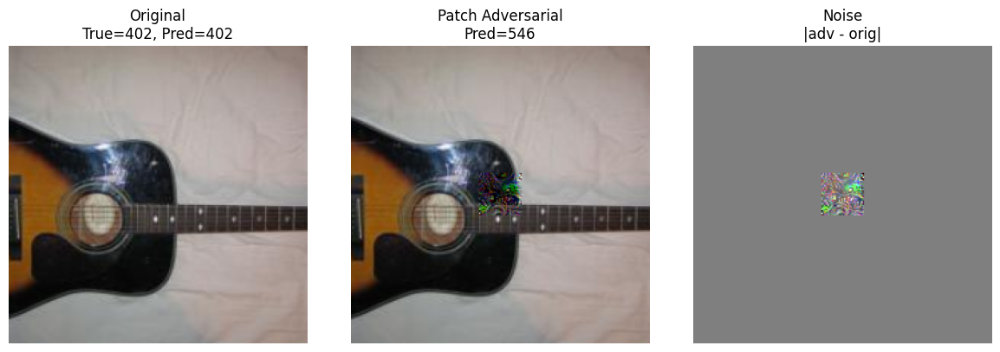

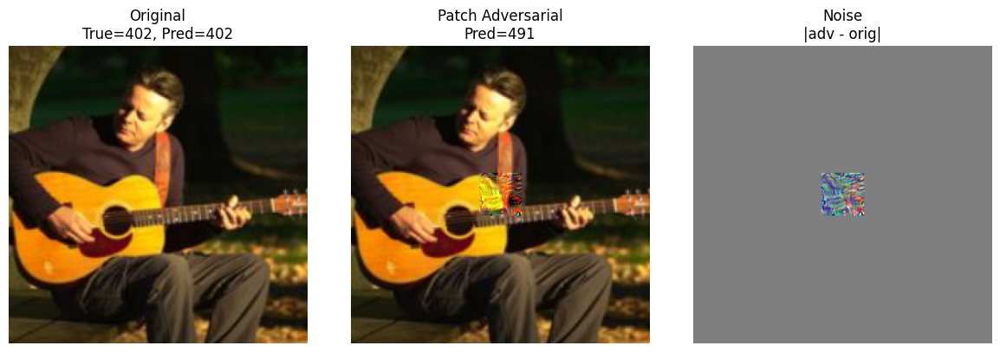

In [23]:
def visualize_attack(img_orig, img_adv, label, model, mean, std):
    model.eval()

    # Standardize images for prediction
    img_o_input = (img_orig.to(device) - mean) / std
    img_a_input = (img_adv.to(device) - mean) / std

    with torch.no_grad():
        pred_o = model(img_o_input).argmax(1).item()
        pred_a = model(img_a_input).argmax(1).item()

    # Compute normalized perturbation for visualization
    pert = img_adv - img_orig
    pert = (pert - pert.min()) / (pert.max() - pert.min() + 1e-8)

    # Plot
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    axs[0].imshow(to_pil_image(img_orig.squeeze()))
    axs[0].set_title(f"Original\nTrue={label}, Pred={pred_o}")
    axs[0].axis("off")

    axs[1].imshow(to_pil_image(img_adv.squeeze()))
    axs[1].set_title(f"Patch Adversarial\nPred={pred_a}")
    axs[1].axis("off")

    axs[2].imshow(to_pil_image(pert.squeeze()))
    axs[2].set_title("Noise\n|adv - orig|")
    axs[2].axis("off")

    plt.tight_layout()
    plt.show()
for img_o, img_a, lbl in mis_examples_patch:
    visualize_attack(img_o, img_a, lbl, model, mean, std)



### Summary of Tasks 1–4 (ResNet-34 Evaluation)

So far, Tasks 1–4 have been completed using a ResNet-34 model evaluated on the original and three adversarially perturbed test sets. The top-1 and top-5 accuracies under each attack type are summarized below:

- **Task 1 (Baseline)**:  
  Top-1 = 75.39%, Top-5 = 93.87%

- **Task 2 (FGSM)**:  
  Top-1 = 3.00%, Top-5 = 19.00%

- **Task 3 (PGD, ε = 0.02, 10 steps)**:  
  Top-1 = 0.00%, Top-5 = 0.80%

- **Task 4 (Patch Attack, ε = 0.4, 32×32 patch)**:  
  Top-1 = 9.80%, Top-5 = 38.20%

These results demonstrate that even visually subtle pixel-wise perturbations (Tasks 2 and 3) can severely degrade model performance, with PGD being the most effective. In contrast, the patch-based attack causes moderate degradation, highlighting the spatial sensitivity of the model. The next task will assess whether these adversarial examples can transfer to other architectures.


# Task 5

In [26]:
import os
import torch
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from tqdm import tqdm

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load DenseNet121 model with pretrained ImageNet weights
new_model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1).to(device).eval()

# ImageNet normalization
normalize_only = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std =[0.229, 0.224, 0.225])

# Image preprocessing pipeline
prep = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

# Construct true labels for all datasets (5 images per class × 100 classes)
expanded_labels = []
for i in range(100):
    expanded_labels += [numeric_labels[i]] * 5

# Paths to all evaluation datasets
datasets_paths = {
    "Original": "./TestDataSet",
    "AdvTestSet1_FGSM": "./Adversarial_Test_Set_1",
    "AdvTestSet2_PGD": "./Adversarial_Test_Set_2",
    "AdvTestSet3_Patch": "./Adversarial_Test_Set_3"
}

class AdvDataset(Dataset):
    def __init__(self, image_dir, labels, transform):
        self.paths = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])
        self.dir = image_dir
        self.labels = labels
        self.trans = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, i):
        path = os.path.join(self.dir, self.paths[i])
        img = Image.open(path).convert("RGB")
        return self.trans(img), self.labels[i]

results = []

def evaluate_dataset(path, labels, model, name):
    if name == "Original":
        ds = datasets.ImageFolder(path, transform=prep)
        loader = DataLoader(ds, batch_size=32, shuffle=False)
        correct1 = correct5 = total = 0
        with torch.no_grad():
            for imgs, folder_idxs in loader:
                imgs = imgs.to(device)
                lbls = torch.tensor([numeric_labels[i] for i in folder_idxs.tolist()], device=device)
                imgs = normalize_only(imgs)
                out = model(imgs)
                _, pred5 = out.topk(5, dim=1)
                total += lbls.size(0)
                correct1 += (pred5[:, 0] == lbls).sum().item()
                for p, true in zip(pred5, lbls):
                    if true.item() in p.tolist():
                        correct5 += 1
    else:
        ds = AdvDataset(path, labels, transform=transforms.Compose([
            transforms.ToTensor(),
            normalize_only
        ]))
        loader = DataLoader(ds, batch_size=32, shuffle=False)
        correct1 = correct5 = total = 0
        with torch.no_grad():
            for imgs, lbls in loader:
                imgs = imgs.to(device)
                lbls = torch.tensor(lbls, device=device)
                out = model(imgs)
                _, pred5 = out.topk(5, dim=1)
                total += lbls.size(0)
                correct1 += (pred5[:, 0] == lbls).sum().item()
                for p, true in zip(pred5, lbls):
                    if true.item() in p.tolist():
                        correct5 += 1

    acc1 = 100 * correct1 / total
    acc5 = 100 * correct5 / total
    results.append((name, total, acc1, acc5))

# Run evaluation on all datasets
for name, path in datasets_paths.items():
    evaluate_dataset(path, expanded_labels, new_model, name)

# Print results in aligned format
print("\n--- Task 5 Results: DenseNet-121 Performance ---")
print("-------------------------------------------------------------")
print(f"{'Dataset':<25} | {'Samples':<7} | {'Top-1 Acc (%)':<14} | {'Top-5 Acc (%)'}")
print("-------------------------------------------------------------")
for name, total, acc1, acc5 in results:
    print(f"{name:<25} | {total:<7} | {acc1:<14.2f} | {acc5:.2f}")
print("-------------------------------------------------------------")



Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 177MB/s]
<ipython-input-26-bed70026745c>:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  lbls = torch.tensor(lbls, device=device)



--- Task 5 Results: DenseNet-121 Performance ---
-------------------------------------------------------------
Dataset                   | Samples | Top-1 Acc (%)  | Top-5 Acc (%)
-------------------------------------------------------------
Original                  | 500     | 70.80          | 91.20
AdvTestSet1_FGSM          | 500     | 40.00          | 69.60
AdvTestSet2_PGD           | 500     | 32.20          | 68.20
AdvTestSet3_Patch         | 500     | 61.60          | 85.60
-------------------------------------------------------------
